# Imports

We begin with some technicalities, like random seed setting and library imports.

In [1]:
import torch
import time
import random
import math
import numpy as np
import pandas as pd
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# this function sets all the possible random seeds
# very helpful for reproducibility
def set_seed(seed=1):
    torch.manual_seed(seed)
    random.seed(seed)
    np.random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

We also adapt the code from `Lab 13` homework description - this is able to generate our odd-shape image dataset.

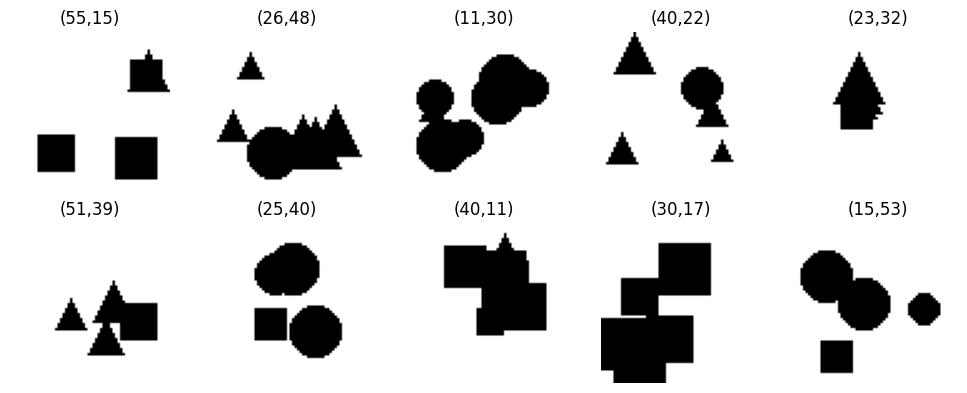

In [2]:
set_seed(240701) # for reproducibility

IMAGE = 64
SHAPES = ("circle", "square", "triangle")

def draw_shape(drawer, shape_type, center_x, center_y, radius):
    if shape_type == "circle":
        drawer.ellipse([center_x - radius, center_y - radius,
                        center_x + radius, center_y + radius], fill="black")
    elif shape_type == "square":
        drawer.rectangle([center_x - radius, center_y - radius,
                          center_x + radius, center_y + radius], fill="black")
    else:  # triangle
        drawer.polygon([
            (center_x, center_y - radius),
            (center_x - radius, center_y + radius),
            (center_x + radius, center_y + radius)
        ], fill="black")

class OddXYDataset(Dataset):
    """
    Generates images on-the-fly:
      * several random shapes of the same type
      * 1 additional shape of a different type
    Returns:
      * image (1×64×64 tensor, float32 normalized to [0,1])
      * label: float tensor [cx, cy] with center of the odd shape
    Arguments:
        num_samples             – total number of samples in the dataset
        same_shape_count_range – tuple (min, max), number of identical shapes
        shape_radius_range      – tuple (min_radius, max_radius) for shape size
    """
    def __init__(self,
                 num_samples,
                 same_shape_count_range=(3, 6),
                 shape_radius_range=(4, 10)):
        self.num_samples = num_samples
        self.same_shape_count_range = same_shape_count_range
        self.radius_min, self.radius_max = shape_radius_range

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        base_shape = random.choice(SHAPES)
        odd_shape = random.choice([s for s in SHAPES if s != base_shape])

        img = Image.new("L", (IMAGE, IMAGE), "white")
        drawer = ImageDraw.Draw(img)

        # draw identical shapes
        for _ in range(random.randint(*self.same_shape_count_range)):
            radius = random.randint(self.radius_min, self.radius_max)
            cx = random.randint(radius, IMAGE - radius - 1)
            cy = random.randint(radius, IMAGE - radius - 1)
            draw_shape(drawer, base_shape, cx, cy, radius)

        # draw the odd shape (with known center)
        radius = random.randint(self.radius_min, self.radius_max)
        cx = random.randint(radius, IMAGE - radius - 1)
        cy = random.randint(radius, IMAGE - radius - 1)
        draw_shape(drawer, odd_shape, cx, cy, radius)

        img_tensor = torch.tensor(np.array(img), dtype=torch.float32).unsqueeze(0) / 255.
        label_tensor = torch.tensor([float(cx), float(cy)], dtype=torch.float32)
        return img_tensor, label_tensor

def show_examples(num_examples=10):
    """
    Displays a grid of image samples from OddXYDataset using a DataLoader with batch_size=1.

    Args:
        num_examples (int): Number of examples to display.
    """
    dataset = OddXYDataset(num_samples=num_examples)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

    num_columns = 5
    num_rows = math.ceil(num_examples / num_columns)

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(num_columns * 2, num_rows * 2))

    for i, (image, label) in enumerate(dataloader):
        if i >= num_examples:
            break
        image_np = image.squeeze(0).squeeze(0).numpy()  # B=1,C=1,H,W --> H,W
        cx, cy = label.squeeze(0)                       # B=1,2       --> 2
        axes.flat[i].imshow(image_np, cmap="gray")
        axes.flat[i].set_title(f"({cx:.0f},{cy:.0f})")
        axes.flat[i].axis("off")

    for j in range(i + 1, num_rows * num_columns):
        axes.flat[j].axis("off")

    plt.tight_layout()
    plt.show()


show_examples()

As we can see, each image indeed consists of geometric shapes - many shapes of one type and one of different type. The task is to train a neural network that is able to identify the coordinates of the odd shape.

We adapt functions from `Lab 13` notebook with some minor changes that make them suitable for our task. The first function can visualize the training loss (RMSE), the second function is able to train the neural network.

In [3]:
def plot_training_curves(train_loss):
    fig, ax = plt.subplots(figsize=(14, 5))

    # Plot Loss
    ax.plot(train_loss, label="Train Loss (RMSE)", color='blue')
    ax.axhline(5.0, color='red', linestyle='--', label='Target RMSE = 5.0')
    ax.axhline(3.0, color='blue', linestyle='--', label='Target RMSE = 3.0')
    ax.set_ylim(0.0, 15.0)
    ax.set_title("Loss per Epoch (RMSE)")
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Average Loss (RMSE)")
    ax.grid(True)
    ax.legend()

    plt.tight_layout()
    plt.show()

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Working on {device}")

def train_model(net, train_loader, epochs=50, lr=0.001, log_every=1):
    print(f"Working on {device}")
    net = net.to(device)
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()

    train_loss_history = []

    start_time = time.time()

    for epoch in range(epochs):
        
        set_seed(2407 + 25*epoch) # for reproducibility
        
        net.train()
        train_loss_sum = 0.0
        train_total = 0

        for batch_inputs, batch_labels in train_loader:
            batch_inputs = batch_inputs.to(device)
            batch_labels = batch_labels.to(device)

            optimizer.zero_grad()
            output = net(batch_inputs) 
            
            loss = criterion(output, batch_labels)
            loss.backward()
            optimizer.step()

            train_loss_sum += loss.item() * batch_inputs.size(0)
            train_total += batch_inputs.size(0)

        avg_train_loss = np.sqrt(train_loss_sum / train_total)
        train_loss_history.append(avg_train_loss)
        
        if epoch % log_every == 0:
            print(f"Epoch {epoch:03d} | "
                  f"Train Loss (RMSE): {avg_train_loss:.4f}")

    end_time = time.time()
    print(f"Elapsed time: {end_time - start_time:.2f} seconds")

    return train_loss_history

Working on cuda


# Network architecture

The code below defines the network architecture. It has been divided into three main classes.
- `PositionalEncoding`: the class which performs positional encoding, which aims to make the net "aware" of pixel positions.
- `SelfAttention`: the class which performs the self-attention transformation, which is in fact transformation of the data into query-and-key space. It allows the network to include dependencies between pixels.
- `Net_SelfAttention`: the main neural network class. It binds the whole architecture, including positional encoding, self-attention and 

In [5]:
BATCH_SIZE = 256
model_dim = 64          # model dimension
k = 8                   # query/key dimension (low-rank)

# Positional Encoding
class PositionalEncoding(torch.nn.Module):
    """
    Class with the positional encoding architecture
    """
    def __init__(self, middle_dim, model_dim): # 'middle_dim' value will be further determined, it comes from convolutional layers
        super().__init__()
        posenc = torch.zeros(middle_dim, model_dim)  # (middle_dim, model_dim)
        position = torch.arange(0, middle_dim).unsqueeze(1)  # (middle_dim, 1)
        mul = torch.exp(np.log(10_000.0) * torch.arange(0, model_dim, 2) / model_dim)  # (model_dim/2, )
        # this is equivalent to 10_000 ** (i/model_dim)
        posenc[:, 0::2] = torch.sin(position / mul)  # (middle_dim, model_dim/2)
        posenc[:, 1::2] = torch.cos(position / mul)  # (middle_dim, model_dim/2)
        
        self.posenc = posenc.unsqueeze(0)  # (1, middle_dim, model_dim)
        
    def forward(self, x):  # (batch, middle_dim, model_dim)    
        return x + self.posenc[:, :x.size(1)].to(x.device)  # (batch, middle_dim, model_dim)
    
class SelfAttention(torch.nn.Module):
    """
    Class with the self-attention architecture
    """
    def __init__(self):
        super().__init__()
        self.Q = torch.nn.Linear(model_dim, k)              # query projection (model_dim x k)
        self.K = torch.nn.Linear(model_dim, k)              # key projection (model_dim x k)
        self.V = torch.nn.Linear(model_dim, model_dim)      # value projection (model_dim x model_dim)
        self.dropout = torch.nn.Dropout(0.1)
        self.attention = None  # will store softmaxed attention weights for inspection later

    def forward(self, x):                        # (batch, middle_dim, model_dim)
        queries = self.Q(x)                      # (batch, middle_dim, k)
        keys = self.K(x)                         # (batch, middle_dim, k)
        values = self.V(x)                      # (batch, middle_dim, model_dim)

        # Compute energy scores:
        energies = queries @ keys.transpose(-2, -1)     # (batch, middle_dim, middle_dim)
        energies = energies / (k ** 0.5)                # it is an additional rescale helping the stability

        # Normalize energies into attention weights
        self.attention = F.softmax(energies, dim=-1)         # (batch, middle_dim, middle_dim)
        self.attention = self.dropout(self.attention)
        
        # Apply attention weights to values:
        output = self.attention @ values                     # (batch, middle_dim, model_dim)

        return output

debug = False
class Net_SelfAttention(torch.nn.Module):
    """
    Class bringing the whole architecture together
    """
    def __init__(self):
        super().__init__()
        
        self.attention = SelfAttention()
        self.PosEnc = PositionalEncoding(256, model_dim)
        
        self.relu = torch.nn.ReLU()
        self.dropout = torch.nn.Dropout(0.1)
        self.norm = torch.nn.LayerNorm(model_dim)
        
        # convolution part
        # recall: dim_out = [(dim_in - k + 2p)/s] + 1 where [...] denotes 'floor' function
        self.conv1 = torch.nn.Conv2d(in_channels=1, out_channels=model_dim, 
                                     kernel_size=5, stride=4, padding=2)
        # dim_out = [(64 - 5 + 4)/4] + 1 = 16
        self.conv2 = torch.nn.Conv2d(in_channels=model_dim, out_channels=model_dim, 
                                     kernel_size=3, stride=1, padding=1)
        # dim_out = [(16 - 3 + 2)/1] + 1 = 16
        
        # linear part: module 1
        # this will be used to generate "probabilities"
        self.linear1 = torch.nn.Linear(model_dim, model_dim//2)
        self.linear2 = torch.nn.Linear(model_dim//2, 1)
        
        # linear part: module 2
        # this will be used to generate "centers"
        self.linear3 = torch.nn.Linear(model_dim, model_dim)
        self.linear4 = torch.nn.Linear(model_dim, model_dim//2)
        self.linear5 = torch.nn.Linear(model_dim//2, model_dim//4)
        self.linear6 = torch.nn.Linear(model_dim//4, 2)
        
        # we notify the net not to treat "centers" as parameters - they should not be trained!
        self.register_buffer("centers", self.const_centers())  # (256, 2)

    # we construct a grid so that the model is "aware of geometry"
    # the centers should not be at or very close to the edge of the image, 
    # so we use linspace with start=2 and end=62 (image is from 0 to 63)
    def const_centers(self):
        c = torch.linspace(2, 62, 16)  # (16,)
        yy, xx = torch.meshgrid(c, c, indexing='ij')  # (16, 16) x (16, 16)
        centers = torch.stack([xx, yy], dim=-1).reshape(-1, 2)  # (256, 2)
        return centers
    
    def forward(self, x): # (batch, 1, 64, 64)
        if debug: print('Input', x.shape)
        
        x = self.relu(self.conv1(x))    # (batch, 64, 16, 16)
        if debug: print('Conv1', x.shape)
        
        x = self.relu(self.conv2(x))    # (batch, 64, 16, 16)
        if debug: print('Conv2', x.shape)
        
        x = torch.nn.Flatten(-2)(x)     # (batch, 64, 256)
        if debug: print('F', x.shape)
        
        x = x.transpose(1, 2)           # (batch, 256, 64)
        if debug: print('T', x.shape)
        
        # IMPORTANT: 
        # 256 corresponds to 'middle_dim' from the above code
        # 64 corresponds to 'model_dim' from the above code
        
        # Positional encoding
        x = self.PosEnc(x)      # (batch, 256, 64)
        if debug: print('PosEnc', x.shape)
        
        # Normalization 1
        x = self.norm(x)        # (batch, 256, 64)
        if debug: print('Norm1', x.shape)
        
        # Self-attention
        x = self.attention(x)   # (batch, 256, 64)
        if debug: print('Att', x.shape)
        
         # Normalization 2
        x = self.norm(x)        # (batch, 256, 64)
        if debug: print('Norm2', x.shape)
        
        # First linear module of the network
        # it aims to produce "probabilities" of hitting the true center of shape
        probs = self.relu(self.linear1(x))  # (batch, 256, 32)
        probs = self.dropout(probs)
        if debug: print('Lin1', probs.shape)
        
        # notice no ReLU here!
        probs = self.linear2(probs)      # (batch, 256, 1)
        probs = probs.squeeze(-1)        # (batch, 256)
        probs = F.softmax(probs, dim=-1) # (batch, 256)
        probs = probs.unsqueeze(-1)      # (batch, 256, 1)
        if debug: print('Lin2', probs.shape)
        
        # Second linear module of the network
        # it aims to produce center of shape
        # notice that the input is not 'probs', but again 'x'
        x = self.relu(self.linear3(x))   # (batch, 256, 64)
        x = self.dropout(x)
        if debug: print('Lin3', x.shape)
        
        x = self.relu(self.linear4(x))   # (batch, 256, 32)
        x = self.dropout(x)
        if debug: print('Lin4', x.shape)
        
        x = self.relu(self.linear5(x))   # (batch, 256, 16)
        x = self.dropout(x)
        if debug: print('Lin5', x.shape)
        
        # notice no ReLU here!
        x = self.linear6(x)              # (batch, 256, 2)
        x = self.dropout(x)
        if debug: print('Lin6', x.shape)
        
        # Near the end...
        # before we wrote that "x" should contain true center
        # instead, we treat "x" as deviation from the centers from constant grid
        x = probs * (self.centers + x)   # (batch, 256, 1) * (batch, 256, 2) -> (batch, 256, 2) (due to broadcasting)
        if debug: print('probs * (centers + x)', x.shape)
        
        x = x.sum(dim=1)                 # (batch, 2)
        if debug: print('Sum', x.shape)
        
        if debug: raise RuntimeError('Debug mode is turned on.')
    
        return x

The network architecture is as follows. At the beginning we also generate a regular grid of $256$ points in the image that is not trainable and aims to help the model recognize the possible center values (geometry of the image). In the code this structure is constant throuout the training and is referred to as `self.centers`.

The network itself has the following construction. The input is a batch of images. We sequentially apply:
- a convolutional layer with $1$ input channel, $64$ output channels, `kernel_size = 5`, `stride = 4` and `padding = 2`
- ReLU
- a convolutional layer with $64$ input channels, $64$ output channels, `kernel_size = 3`, `stride = 1` and `padding = 1`
- ReLU

Next, we apply positional encoding and then self-attention with normalization before and after.

After this is done, the architecture splits in two independent parts. One part is responsible for generating "probabilities" of hitting the target center and the other one is responsible for producing the base prediction for center coordinates.

The first one contains:
- a linear layer $(64 \to 32)$, ReLU and dropout
- a linear layer $(32 \to 1)$
- softmax to produce probabilites

The second one contains:
- a linear layer $(64 \to 64)$, ReLU and dropout
- a linear layer $(64 \to 32)$, ReLU and dropout
- a linear layer $(32 \to 16)$, ReLU and dropout
- a linear layer $(16 \to 2)$ and dropout

In the end we combine the two independent parts of the architecture via multiplication (allowed due to broadcasting) and we sum-out the middle axis (of index `1`) to obtain the predictions for odd-shape centers.

# Network training

The code in the cell below actually performs the training of `Net_SelfAttention` model.

Working on cuda
Epoch 000 | Train Loss (RMSE): 13.4846
Epoch 001 | Train Loss (RMSE): 13.0072
Epoch 002 | Train Loss (RMSE): 12.0864
Epoch 003 | Train Loss (RMSE): 11.0846
Epoch 004 | Train Loss (RMSE): 8.9699
Epoch 005 | Train Loss (RMSE): 8.5713
Epoch 006 | Train Loss (RMSE): 8.2814
Epoch 007 | Train Loss (RMSE): 6.7181
Epoch 008 | Train Loss (RMSE): 5.5616
Epoch 009 | Train Loss (RMSE): 5.0317
Epoch 010 | Train Loss (RMSE): 4.5372
Epoch 011 | Train Loss (RMSE): 4.3697
Epoch 012 | Train Loss (RMSE): 4.1916
Epoch 013 | Train Loss (RMSE): 4.1414
Epoch 014 | Train Loss (RMSE): 3.9330
Epoch 015 | Train Loss (RMSE): 3.9171
Epoch 016 | Train Loss (RMSE): 3.7837
Epoch 017 | Train Loss (RMSE): 3.7837
Epoch 018 | Train Loss (RMSE): 3.6005
Epoch 019 | Train Loss (RMSE): 3.5998
Epoch 020 | Train Loss (RMSE): 3.5051
Epoch 021 | Train Loss (RMSE): 3.7327
Epoch 022 | Train Loss (RMSE): 3.4681
Epoch 023 | Train Loss (RMSE): 3.4019
Epoch 024 | Train Loss (RMSE): 3.4409
Epoch 025 | Train Loss (RMSE):

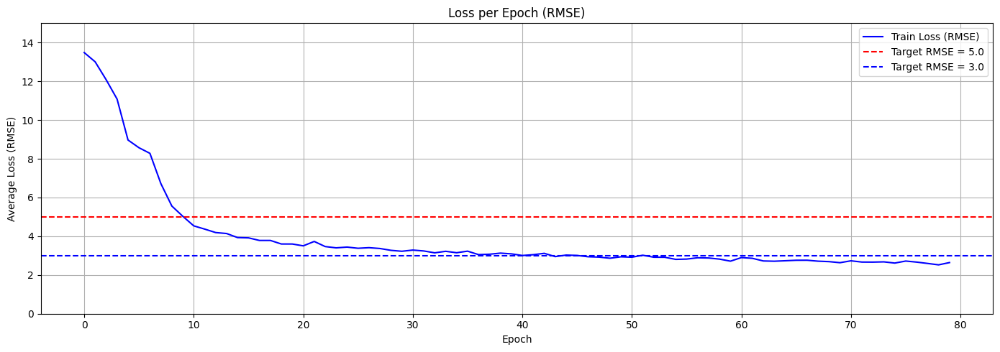

In [6]:
set_seed(240701) # for reproducibility

# Instantiate and train
dataset = OddXYDataset(num_samples=25_000)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False)

net = Net_SelfAttention()
train_loss = train_model(net, dataloader, epochs=80)
plot_training_curves(train_loss)

As we can see, we managed to bring RMSE loss below the threshold of $3.0$.

# Attention heatmaps

After the training is performed, we can analyze the self-attention performance. In order to do it, we present some randomly chosen images and plot them next to query-key heatmaps. By doing this we can uncover some connections that emerged inside the self-attention query-key space.

In [9]:
def attention_heatmaps(net, dataset, i, top = 5):
    """
    Input:
    - index of an image in the dataset
    
    Output:
    - image with a true center of the odd shape and with the center prediction
    - standard attention heatmap
    - logarithmic attention heatmap
    """
    net.eval()
    img, label = dataset[i]
    img_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred = net(img_tensor)
        attention = net.attention.attention.squeeze(0).detach().cpu().numpy()

    pred = pred.squeeze().cpu().numpy()
    img = img.squeeze().cpu().numpy()
    label = label.numpy()

    top_att = np.argsort(attention.sum(axis=0))[-top:][::-1]
    print(top_att)
    
    fig, ax = plt.subplots(1, 3, figsize=(15, 5), layout='tight')

    ax[0].imshow(img, cmap='gray')
    ax[0].scatter(*label, c='green', s=40, label='True center')
    ax[0].scatter(*pred, c='red', marker='x', s=40, label='Predicted center')

    x_true, y_true = label
    ax[0].text(x_true, y_true, f"True center: ({x_true:.1f}, {y_true:.1f})", color='green')
    
    for key_index in top_att:
        
        row, col = divmod(key_index, 16) # divmod(n, k) returns tuple (n//k, n % k)
        x = 2 + 4 * col
        y = 2 + 4 * row
        
        ax[0].scatter(x, y, c='blue', s=40, marker='o', label='Top Attention')
        ax[0].text(x, y, f"{key_index}", color='orange')
        
    ax[0].set_title(f"Image {i}, RMSE of prediction: {np.linalg.norm(label - pred):.2f}")
    ax[0].axis('off')
    ax[0].legend()

    
    standard_att = ax[1].imshow(attention, cmap='viridis')
    ax[1].set_title("Attention heatmap")
    ax[1].set_xlabel("Key")
    ax[1].set_ylabel("Query")
    fig.colorbar(standard_att, ax=ax[1], label='weight')

    log_att = ax[2].imshow(attention, cmap='viridis', norm=LogNorm(vmin=attention.min()+10**(-8), vmax=attention.max()))
    ax[2].set_title("Log attention heatmap")
    ax[2].set_xlabel("Key")
    ax[2].set_ylabel("Query")
    fig.colorbar(log_att, ax=ax[2], label="log-scaled weight")

    plt.show()

[6 7 5 8 4]


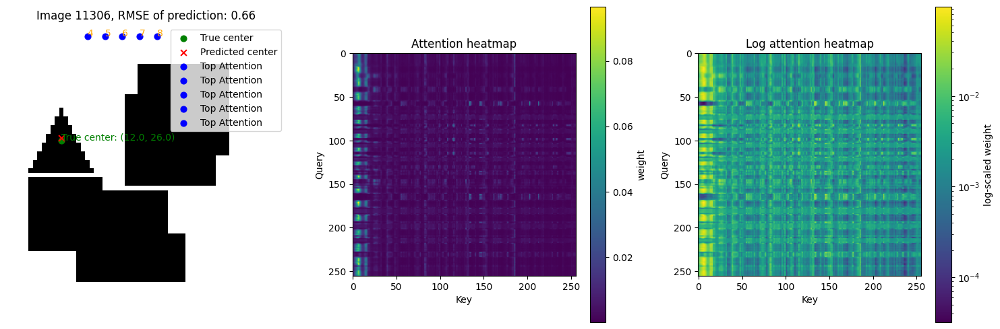

[6 7 5 8 4]


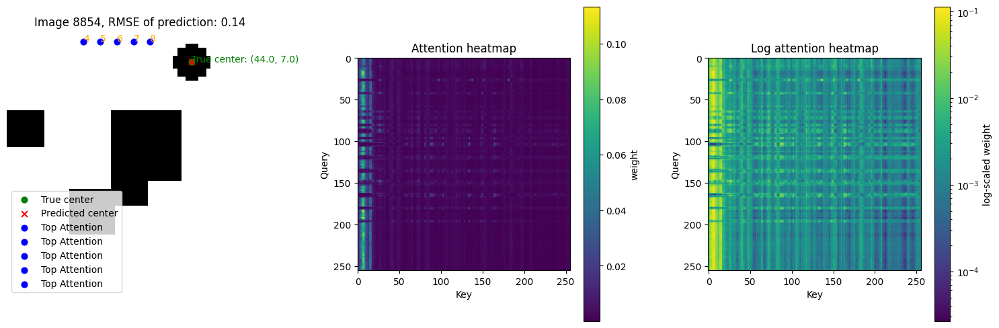

[6 7 5 8 4]


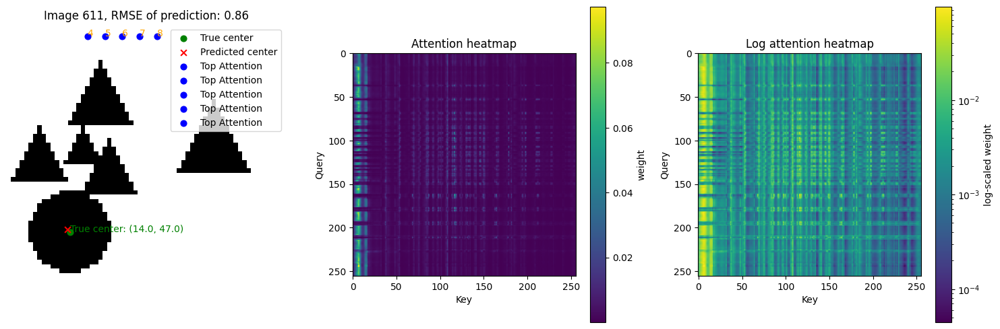

[6 7 5 8 4]


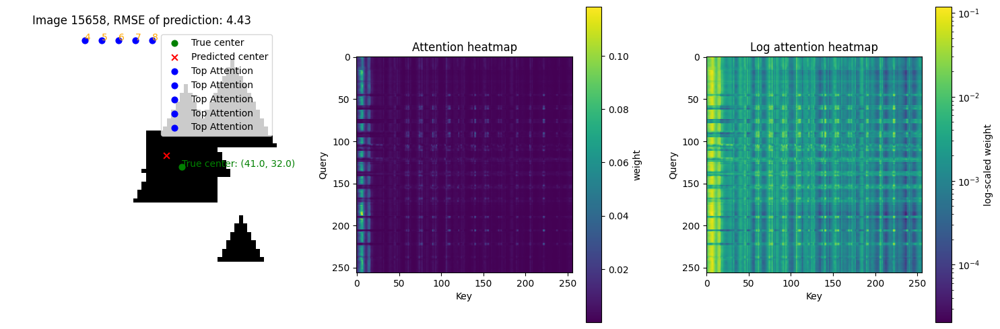

[6 7 5 8 4]


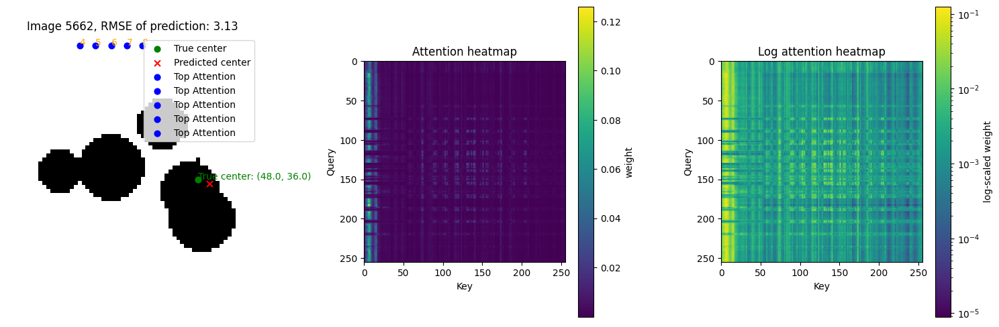

[6 7 5 4 8]


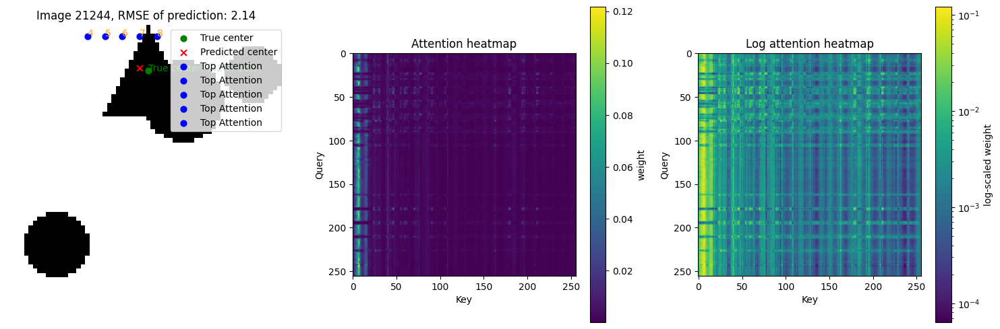

[6 7 5 8 4]


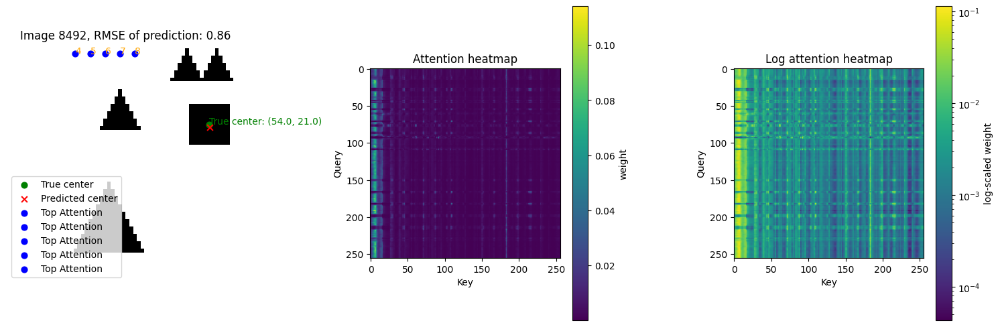

[ 8  6  7 14 15]


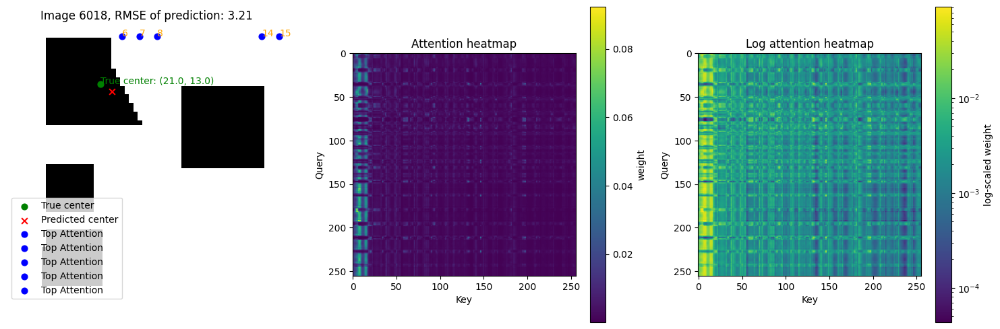

[ 5  4 14 15  6]


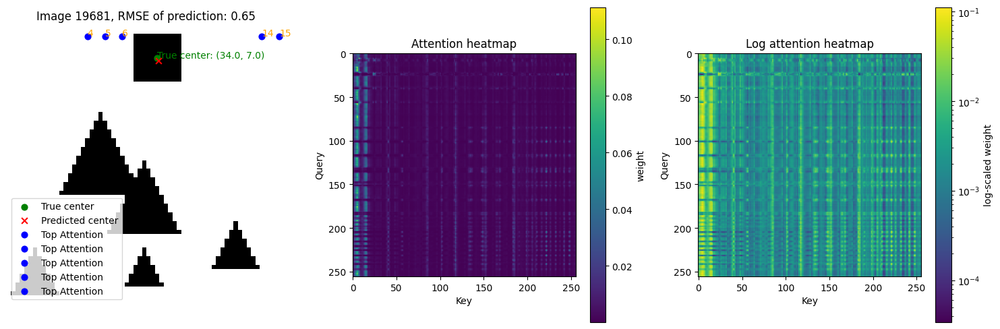

[6 7 5 8 4]


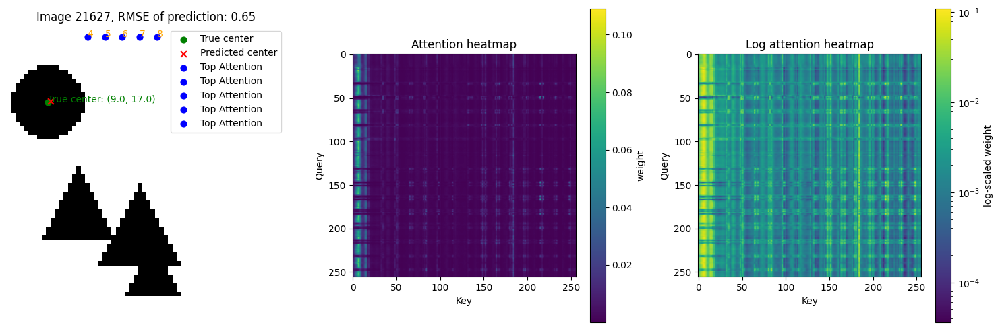

[6 7 5 8 3]


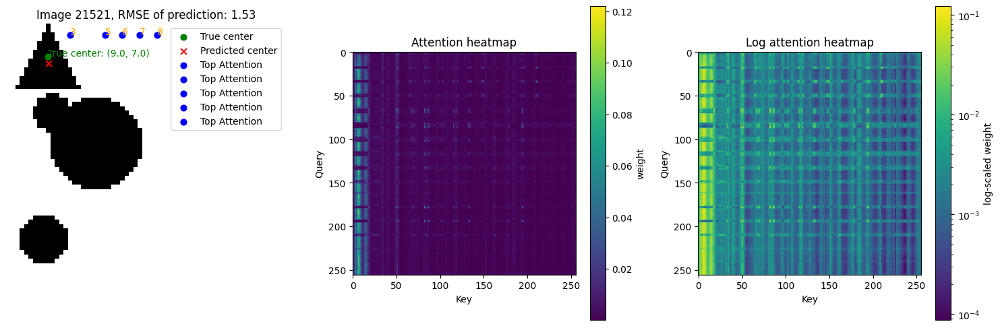

[6 7 5 8 4]


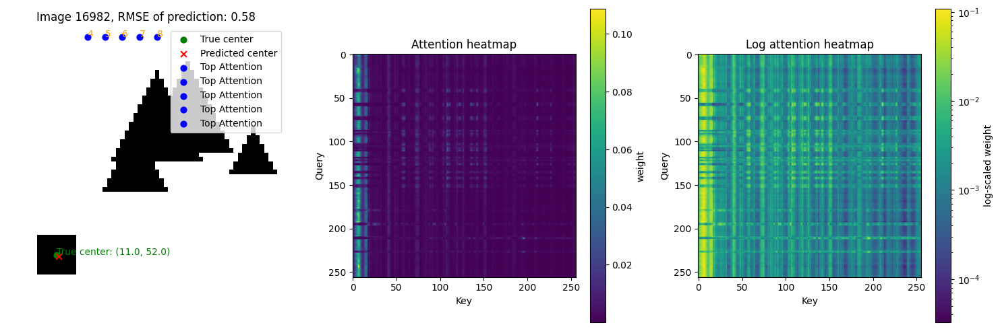

[6 7 5 8 4]


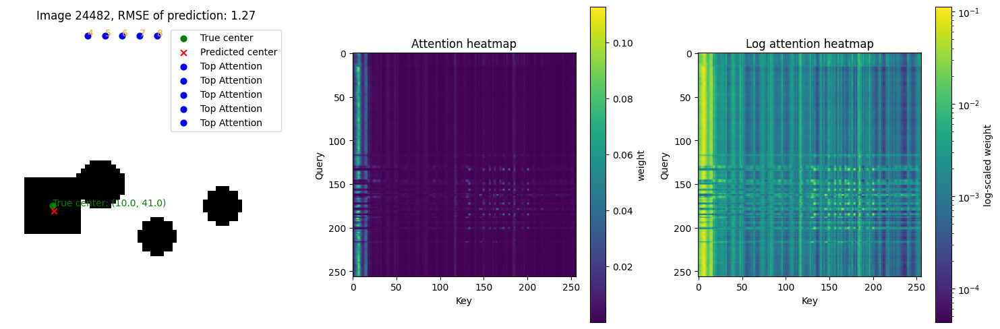

[7 6 5 8 4]


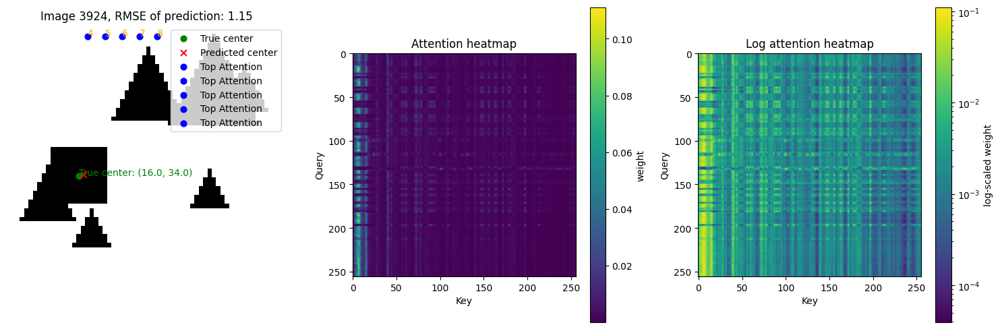

[6 7 5 8 4]


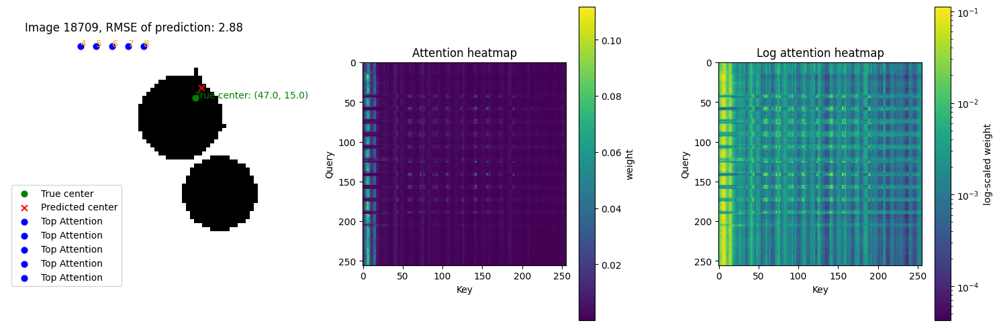

[6 7 5 8 4]


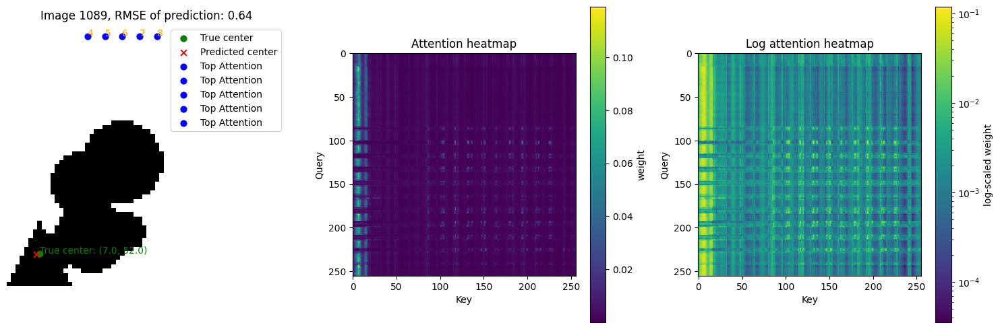

[7 6 8 5 4]


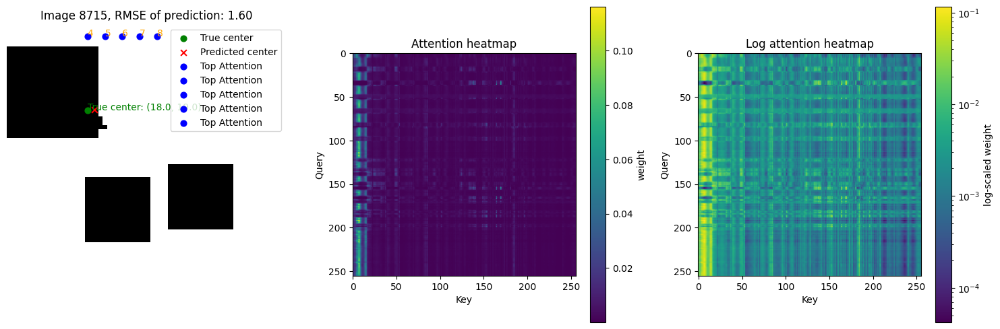

[6 7 5 8 4]


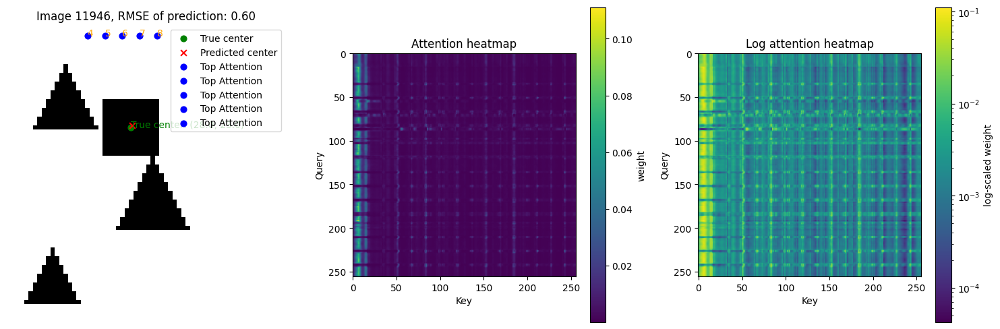

[6 7 5 8 4]


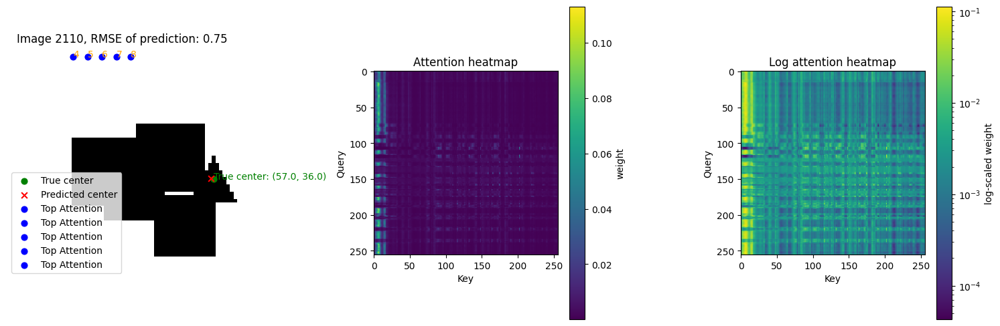

[7 6 5 8 4]


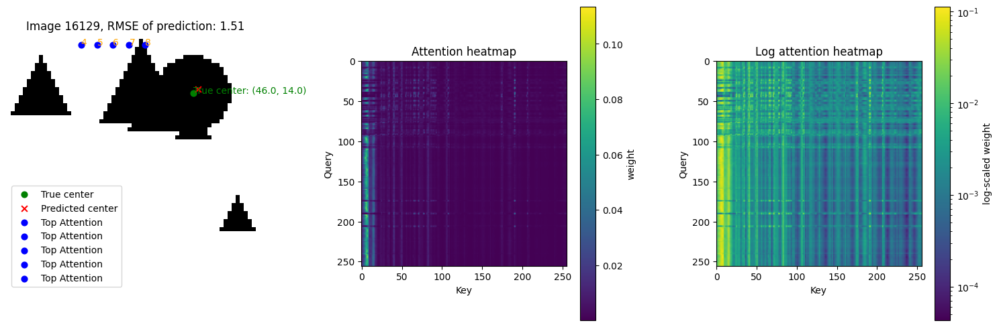

[6 7 5 8 4]


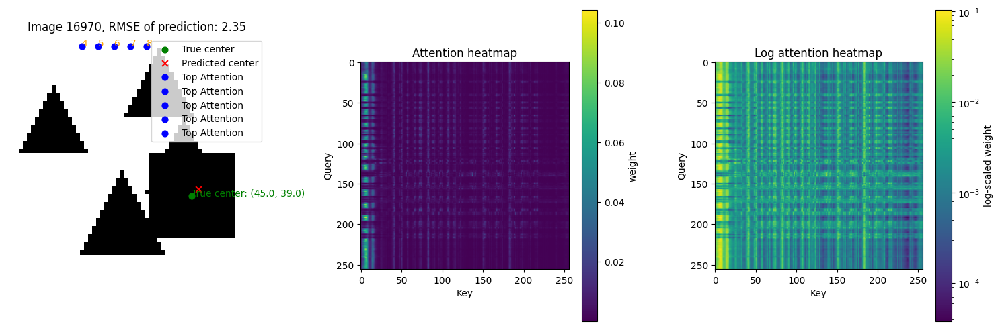

[6 7 5 8 4]


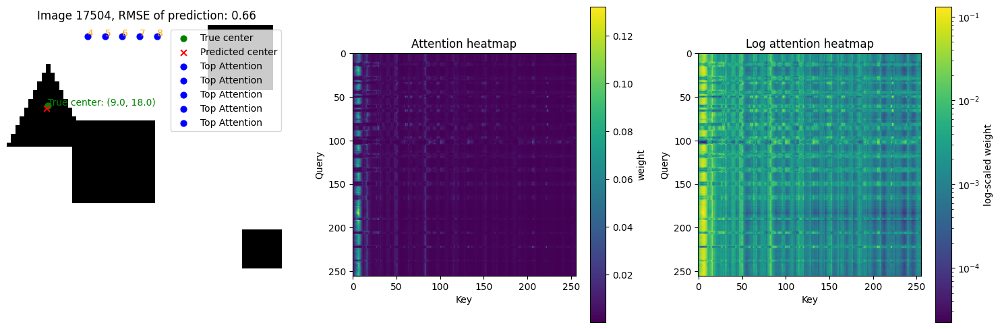

[4 5 6 7 3]


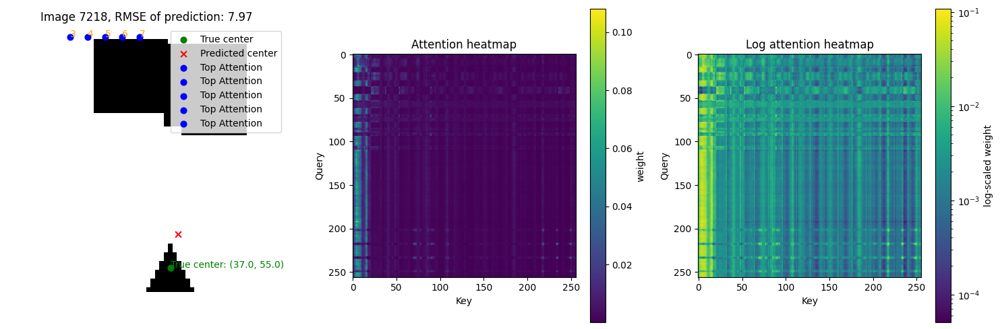

[6 7 5 8 4]


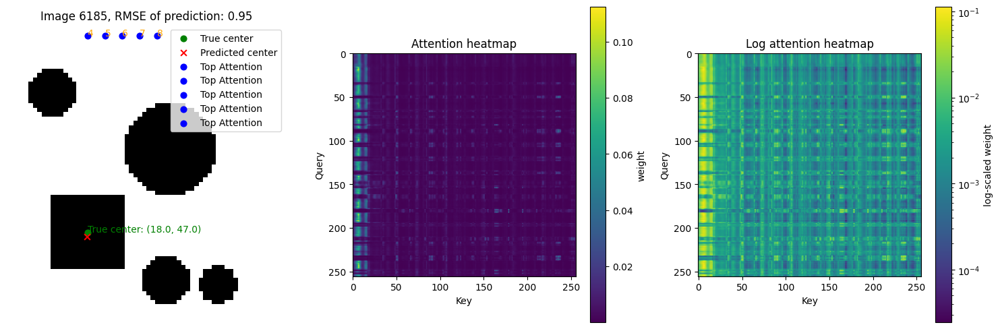

[6 7 5 8 4]


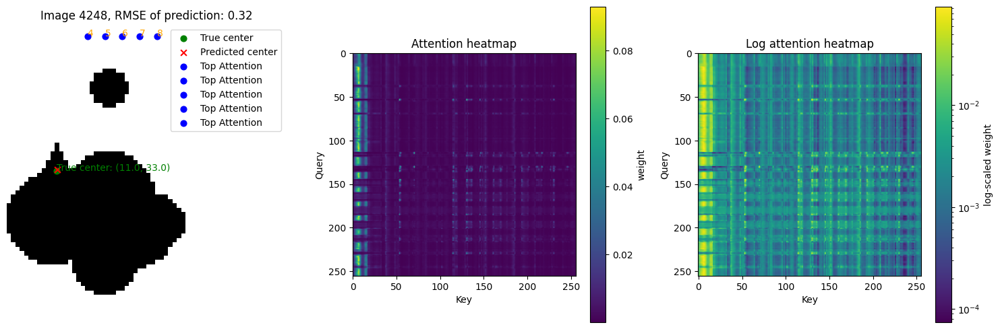

In [10]:
set_seed(240701)

test_data = OddXYDataset(num_samples=25_000)
images_indices = random.sample(range(len(test_data)), 25)
for i in images_indices:
    attention_heatmaps(net, test_data, i)